Import of required modules

In [2]:
import xarray
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cmocean
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import warnings
warnings.filterwarnings('ignore')

Open the desired data file

In [4]:
xds = xarray.open_dataset('dataset-oc-med-chl-multi_cci-l3-chl_1km_daily-rep-v02_1606744185410.nc')
print(xds)

<xarray.Dataset>
Dimensions:  (lat: 248, lon: 195, time: 365)
Coordinates:
  * time     (time) object 2018-01-01 00:00:00 ... 2018-12-31 00:00:00
  * lat      (lat) float32 32.9994 33.009533 33.019665 ... 35.491833 35.501965
  * lon      (lon) float32 9.499028 9.51188 9.524732 ... 11.979409 11.992261
Data variables:
    WTM      (time, lat, lon) float32 ...
    CHL      (time, lat, lon) float32 ...
Attributes:
    Conventions:             CF-1.4
    title:                   dataset-oc-med-chl-multi_cci-l3-chl_1km_daily-re...
    references:              1) Volpe, G., Colella, S., Brando, V. E., Forner...
    institution:             CNR-GOS
    contact:                 technical@gos.artov.isac.cnr.it
    netcdf_version:          v4
    grid_mapping:            Equirectangular
    product_level:           L3
    parameter_code:          CHL
    parameter:               chlorophyll-a concentration
    platform:                Orbview-2/SeaStar,Aqua,ENVISAT,NPP
    sensor_name:           

Select desired time

In [6]:
xds_time = xds.sel(time='2018-01-01 00:00:00')

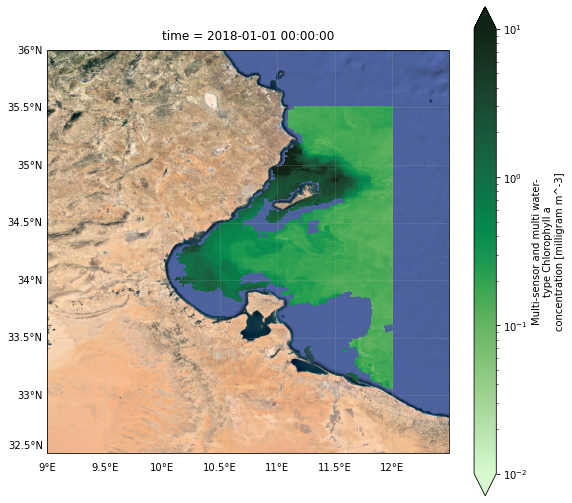

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(9,9), subplot_kw={'projection': ccrs.PlateCarree()})

gl = ax.gridlines(draw_labels=True, alpha=0.2) #add map gridlines
gl.xpadding = 10 #add padding for the x-axis labels
gl.xlabels_top = gl.ylabels_right = False #disable top and right labels
gl.xformatter = LONGITUDE_FORMATTER #format axis label
gl.yformatter = LATITUDE_FORMATTER #format axis label

extent = [xds.geospatial_lon_min-0.5, xds.geospatial_lon_max+0.5, xds.geospatial_lat_min-0.5, xds.geospatial_lat_max+0.5]

ax.set_extent(extent) #set map extent to files extent
request = cimgt.GoogleTiles(style='satellite') #add Google Earth Satellite Basemap
ax.set_aspect('auto', adjustable=None)
ax.add_image(request, 10) #set Google Earth Basemap's zoom level

norm = mcolors.LogNorm(1e-2, 1e1) #create logarithmic colorbar from 0.01 to 10 
xds_time.CHL.plot(cmap=cmocean.cm.algae, norm=norm, extend='both') #plot Chlorophyll concentration

plt.savefig('CHL_Map.jpg', dpi=300, bbox_inches='tight')
plt.show()

Find the chlorophyll at a certain lat/lon point.

In [10]:
lat = 34.25
lon = 10.50

Select coordinates in file

In [12]:
point_ds = xds.sel(lon=lon, lat=lat, method='nearest')

Create a timeseries plot of Chlorophyll concentration for the desired point

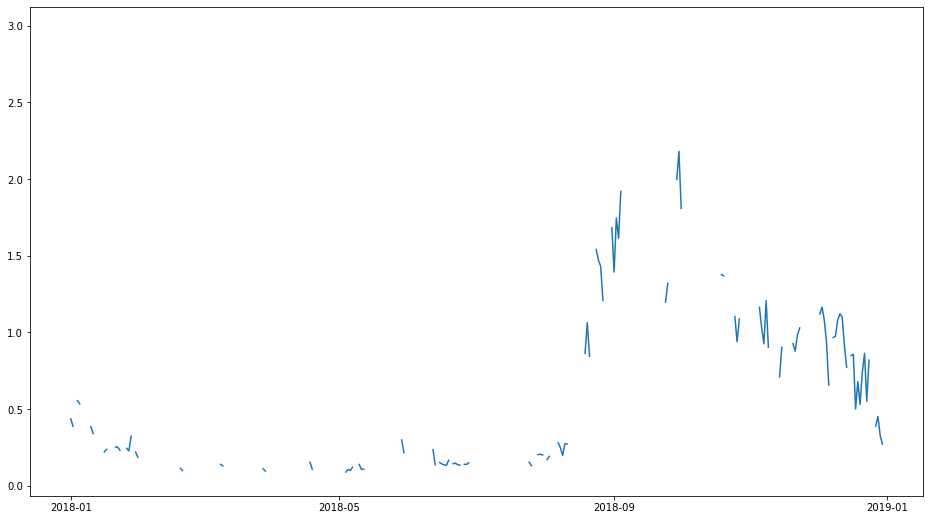

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(16,9))
plt.plot(point_ds.time, point_ds.CHL[:])
plt.savefig('CHL_1point_timeseries.jpg', dpi=300, bbox_inches='tight')
plt.show()

Create a monthly timeseries plot of Chlorophyll concentration for the desired point

"1M" in second line means that you will calculate the mean Chlorophyll concentration in monthly timestep

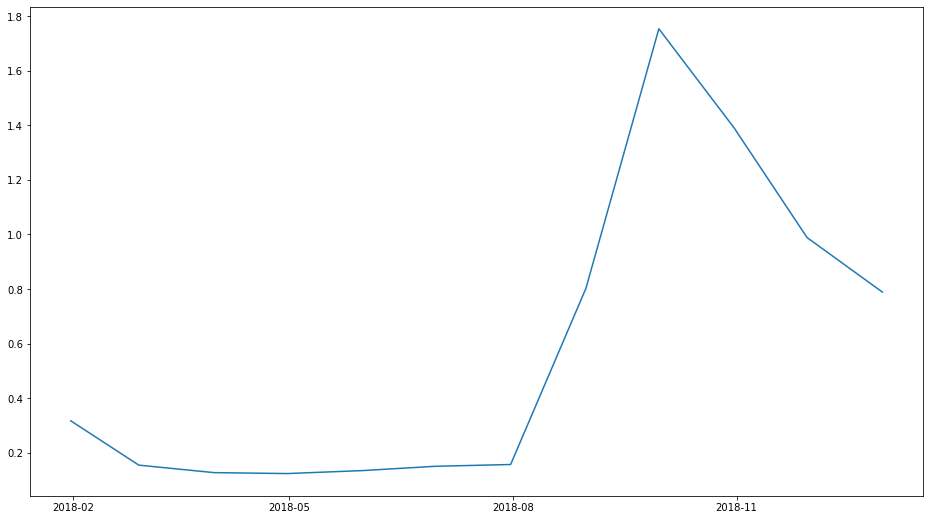

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(16,9))
point_ds_mean = point_ds.resample(time="1M").mean()
plt.plot(point_ds_mean.time, point_ds_mean.CHL[:])
plt.savefig('CHL_1point_timeseries_monthly.jpg', dpi=300, bbox_inches='tight')
plt.show()

Create a timeseries plot of the mean Chlorophyll concentration for the entire area

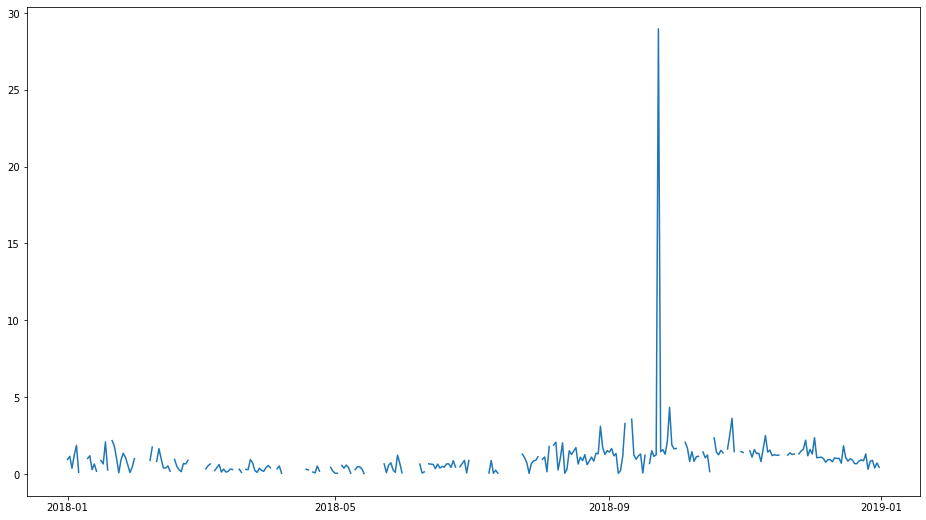

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(16,9))
xds_area_mean = xds.mean(axis=1).mean(axis=1)
plt.plot(xds.time, xds_area_mean.CHL[:])
plt.savefig('CHL_area_timeseries_monthly.jpg', dpi=300, bbox_inches='tight')
plt.show()